# Solving Human Resources Issues

### Preparation

#### Source of data

**Employee Data**

The data contains demographic details, work-related metrics and attrition flag.

- **EmployeeId** - Employee Identifier
- **Attrition** - Did the employee attrition? (0=no, 1=yes)
- **Age** - Age of the employee
- **BusinessTravel** - Travel commitments for the job
- **DailyRate** - Daily salary
- **Department** - Employee Department
- **DistanceFromHome** - Distance from work to home (in km)
- **Education** - 1-Below College, 2-College, 3-Bachelor, 4-Master, 5-Doctor
- **EducationField** - Field of Education
- **EnvironmentSatisfaction** - 1-Low, 2-Medium, 3-High, 4-Very High
- **Gender** - Employee's gender
- **HourlyRate** - Hourly salary
- **JobInvolvement** - 1-Low, 2-Medium, 3-High, 4-Very High
- **JobLevel** - Level of job (1 to 5)
- **JobRole** - Job Roles
- **JobSatisfaction** - 1-Low, 2-Medium, 3-High, 4-Very High
- **MaritalStatus** - Marital Status
- **MonthlyIncome** - Monthly salary
- **MonthlyRate** - Monthly rate
- **NumCompaniesWorked** - Number of companies worked at
- **Over18** - Over 18 years of age?
- **OverTime** - Overtime?
- **PercentSalaryHike** - The percentage increase in salary last year
- **PerformanceRating** - 1-Low, 2-Good, 3-Excellent, 4-Outstanding
- **RelationshipSatisfaction** - 1-Low, 2-Medium, 3-High, 4-Very High
- **StandardHours** - Standard Hours
- **StockOptionLevel** - Stock Option Level
- **TotalWorkingYears** - Total years worked
- **TrainingTimesLastYear** - Number of training attended last year
- **WorkLifeBalance** - 1-Low, 2-Good, 3-Excellent, 4-Outstanding
- **YearsAtCompany** - Years at Company
- **YearsInCurrentRole** - Years in the current role
- **YearsSinceLastPromotion** - Years since the last promotion
- **YearsWithCurrManager** - Years with the current manager

**Acknowledgements**

[IBM Watson Analytics Use Case for HR Retaining Valuable Employees](https://www.ibm.com/communities/analytics/watson-analytics-blog/watson-analytics-use-case-for-hr-retaining-valuable-employees/)


#### Import the module and dataset

In [1]:
import os
import time
import warnings
# ignore warning
warnings.filterwarnings("ignore")

%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set pandas display options to maximize output visibility
pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", None)
pd.set_option("display.width", 0)
pd.set_option("display.expand_frame_repr", False)

#### Data imported into dataframe 'employee_df'

In [2]:
# Import dataset
datasource = "dataset/employee_data.csv"
employee_df = pd.read_csv(datasource,encoding='windows-1252')

### EDA

#### Data Info

In [3]:
print("Dataframe Info:\n")
employee_df.info()

Dataframe Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   EmployeeId                1470 non-null   int64  
 1   Age                       1470 non-null   int64  
 2   Attrition                 1058 non-null   float64
 3   BusinessTravel            1470 non-null   object 
 4   DailyRate                 1470 non-null   int64  
 5   Department                1470 non-null   object 
 6   DistanceFromHome          1470 non-null   int64  
 7   Education                 1470 non-null   int64  
 8   EducationField            1470 non-null   object 
 9   EmployeeCount             1470 non-null   int64  
 10  EnvironmentSatisfaction   1470 non-null   int64  
 11  Gender                    1470 non-null   object 
 12  HourlyRate                1470 non-null   int64  
 13  JobInvolvement            1470 non-null   int6

In [4]:
employee_df.sample(10)

,EmployeeId,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
326,327,45,1.0,Travel_Frequently,306,Sales,26,4,Life Sciences,1,1,Female,100,3,2,Sales Executive,1,Married,4286,5630,2,Y,No,14,3,4,80,2,5,4,3,1,1,0,0
566,567,26,0.0,Travel_Frequently,921,Research & Development,1,1,Medical,1,1,Female,66,2,1,Research Scientist,3,Divorced,2007,25265,1,Y,No,13,3,3,80,2,5,5,3,5,3,1,3
1164,1165,35,NaN,Travel_Rarely,1224,Sales,7,4,Life Sciences,1,3,Female,55,3,2,Sales Executive,4,Married,5204,13586,1,Y,Yes,11,3,4,80,0,10,2,3,10,8,0,9
156,157,56,NaN,Non-Travel,667,Research & Development,1,4,Life Sciences,1,3,Male,57,3,2,Healthcare Representative,3,Divorced,6306,26236,1,Y,No,21,4,1,80,1,13,2,2,13,12,1,9
346,347,26,0.0,Travel_Frequently,496,Research & Development,11,2,Medical,1,1,Male,60,3,2,Healthcare Representative,1,Married,4741,22722,1,Y,Yes,13,3,3,80,1,5,3,3,5,3,3,3
1134,1135,44,1.0,Travel_Rarely,621,Research & Development,15,3,Medical,1,1,Female,73,3,3,Healthcare Representative,4,Married,7978,14075,1,Y,No,11,3,4,80,1,10,2,3,10,7,0,5
456,457,27,0.0,Travel_Frequently,994,Sales,8,3,Life Sciences,1,4,Male,37,3,3,Sales Executive,3,Single,8726,2975,1,Y,No,15,3,4,80,0,9,0,3,9,8,1,7
526,527,36,1.0,Travel_Rarely,660,Research & Development,15,3,Other,1,1,Male,81,3,2,Laboratory Technician,3,Divorced,4834,7858,7,Y,No,14,3,2,80,1,9,3,2,1,0,0,0
1293,1294,43,NaN,Travel_Frequently,1422,Sales,2,4,Life Sciences,1,1,Male,92,3,2,Sales Executive,4,Married,5675,19246,1,Y,No,20,4,3,80,1,7,5,3,7,7,7,7
1230,1231,54,0.0,Travel_Rarely,397,Human Resources,19,4,Medical,1,3,Male,88,3,3,Human Resources,2,Married,10725,6729,2,Y,No,15,3,3,80,1,16,1,4,9,7,7,1


In [5]:
# Displaying the number of unique values in each column
employee_df.nunique().to_frame()

,0
EmployeeId,1470
Age,43
Attrition,2
BusinessTravel,3
DailyRate,886
Department,3
DistanceFromHome,29
Education,5
EducationField,6
EmployeeCount,1


In [6]:
# Unique values from the 'Attrition' column
employee_df['Attrition'].unique()

array([nan,  1.,  0.])

#### Data format

In [7]:
# Listing type data kolom

employee_col_numeric_int = [
    'Age', 'DailyRate', 'DistanceFromHome',
    'EmployeeCount', 'HourlyRate',
    'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
    'PercentSalaryHike', 'StandardHours',
    'TotalWorkingYears', 'TrainingTimesLastYear',
    'YearsAtCompany', 'YearsInCurrentRole',
    'YearsSinceLastPromotion', 'YearsWithCurrManager'
]
employee_col_numeric_int = pd.Index(employee_col_numeric_int)

employee_col_categorical = [
    'BusinessTravel', 'Department', 'Education', 'EducationField',
    'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
    'JobRole', 'JobSatisfaction', 'MaritalStatus', 'Over18', 'OverTime',
    'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
    'WorkLifeBalance'
]
employee_col_categorical = pd.Index(employee_col_categorical)

employee_col_object = ['EmployeeId']
employee_col_object = pd.Index(employee_col_object)

In [8]:
# Convert to integer
employee_df[employee_col_numeric_int] = employee_df[employee_col_numeric_int].astype('int64')

# Conversion to category
employee_df[employee_col_categorical] = employee_df[employee_col_categorical].astype('category')

# Convert object columns (outside of other categories)
employee_df['EmployeeId'] = employee_df['EmployeeId'].astype('object')

employee_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   EmployeeId                1470 non-null   object  
 1   Age                       1470 non-null   int64   
 2   Attrition                 1058 non-null   float64 
 3   BusinessTravel            1470 non-null   category
 4   DailyRate                 1470 non-null   int64   
 5   Department                1470 non-null   category
 6   DistanceFromHome          1470 non-null   int64   
 7   Education                 1470 non-null   category
 8   EducationField            1470 non-null   category
 9   EmployeeCount             1470 non-null   int64   
 10  EnvironmentSatisfaction   1470 non-null   category
 11  Gender                    1470 non-null   category
 12  HourlyRate                1470 non-null   int64   
 13  JobInvolvement            1470 non-null   catego

#### Zero-Variance Feature

In [9]:
# Removing Zero-Variance Feature
try:
    print("Column with only one unique value:")
    const_cols = [col for col in employee_df.columns if employee_df[col].nunique() == 1]
    print(const_cols)

    employee_df = employee_df.drop(columns=const_cols)

    print("Columns with only one unique value have been removed.")

except KeyError as e:
    print(f"Column not found when dropping: {e}")
except Exception as e:
    print(f"Terjadi error: {e}")
finally:
    print("Zero-Variance column cleaning is complete.")

Column with only one unique value:
['EmployeeCount', 'Over18', 'StandardHours']
Columns with only one unique value have been removed.
Zero-Variance column cleaning is complete.


#### Null, NaN

In [10]:
employee_df.isnull().sum().to_frame()

,0
EmployeeId,0
Age,0
Attrition,412
BusinessTravel,0
DailyRate,0
Department,0
DistanceFromHome,0
Education,0
EducationField,0
EnvironmentSatisfaction,0


Handling NaN in the Attrition column by dropping NaN values.

In [11]:
# Separate rows with NaN values in the 'Attrition' column.
employee_attrition_nan = employee_df[employee_df['Attrition'].isna()]

# Save to CSV file will be used for the prediction file.
employee_attrition_nan.to_csv('saved/employee_attrition_nan.csv', index=False)

# Drop rows with NaN values in the 'Attrition' column to create a clean dataset.
employee_df_clean = employee_df.dropna(subset=['Attrition'])

# Convert the 'Attrition' column to integer type
employee_df_clean['Attrition'] = employee_df_clean['Attrition'].astype(int)

# Show the number of null values after cleaning
print("\nNumber of null values after being cleaned:\n")
employee_df_clean.isnull().sum().to_frame()


Number of null values after being cleaned:



,0
EmployeeId,0
Age,0
Attrition,0
BusinessTravel,0
DailyRate,0
Department,0
DistanceFromHome,0
Education,0
EducationField,0
EnvironmentSatisfaction,0


#### Outlier


Outliers detected using IQR method:

[INFO] No outliers detected in 'Age'.
[INFO] No outliers detected in 'DailyRate'.
[INFO] No outliers detected in 'DistanceFromHome'.
[INFO] No outliers detected in 'HourlyRate'.
[INFO] No outliers detected in 'MonthlyRate'.
[INFO] No outliers detected in 'PercentSalaryHike'.

[OUTLIER] 'MonthlyIncome' — 64 values detected
   Q1 = 2900.25, Median = 4903.50, Q3 = 8736.50
   Lower bound = -5854.12, Upper bound = 17490.88
   Values:
  { 17584: 1x, 17639: 1x, 17650: 1x, 17665: 1x, 17779: 1x, 17856: 1x, 17861: 2x,
  17924: 1x, 18041: 1x, 18061: 1x, 18172: 1x, 18200: 1x, 18213: 1x, 18265: 1x,
  18300: 1x, 18303: 1x, 18430: 1x, 18606: 1x, 18665: 1x, 18711: 1x, 18722: 1x,
  18740: 1x, 18789: 1x, 18824: 1x, 18844: 1x, 18947: 1x, 19033: 1x, 19045: 1x,
  19068: 1x, 19081: 1x, 19094: 1x, 19141: 1x, 19144: 1x, 19187: 1x, 19189: 1x,
  19190: 1x, 19197: 1x, 19202: 1x, 19232: 1x, 19237: 1x, 19246: 1x, 19272: 1x,
  19406: 1x, 19419: 1x, 19436: 1x, 19502: 1x, 19513: 

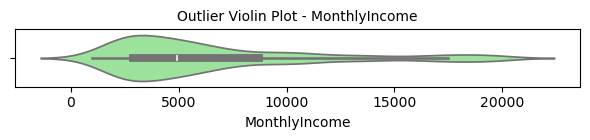

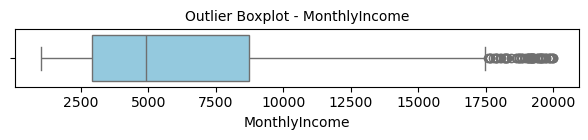


[OUTLIER] 'NumCompaniesWorked' — 43 values detected
   Q1 = 1.00, Median = 2.00, Q3 = 4.00
   Lower bound = -3.50, Upper bound = 8.50
   Values:
  { 9: 43x }


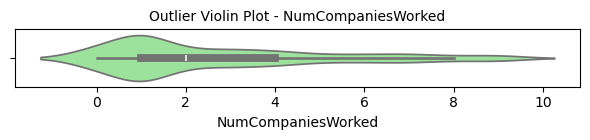

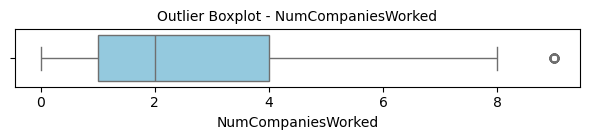


[OUTLIER] 'TotalWorkingYears' — 29 values detected
   Q1 = 6.00, Median = 10.00, Q3 = 16.00
   Lower bound = -9.00, Upper bound = 31.00
   Values:
  { 32: 7x, 33: 7x, 34: 3x, 35: 2x, 36: 4x, 37: 3x, 38: 1x, 40: 2x }


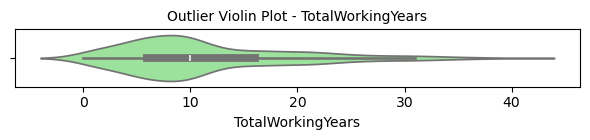

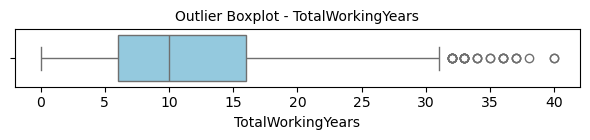


[OUTLIER] 'TrainingTimesLastYear' — 174 values detected
   Q1 = 2.00, Median = 3.00, Q3 = 3.00
   Lower bound = 0.50, Upper bound = 4.50
   Values:
  { 0: 43x, 5: 87x, 6: 44x }


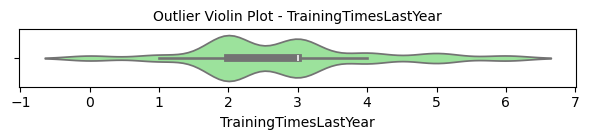

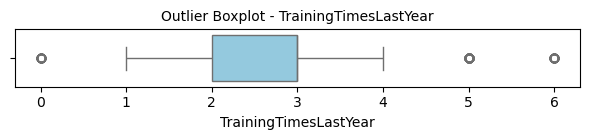


[OUTLIER] 'YearsAtCompany' — 79 values detected
   Q1 = 3.00, Median = 5.00, Q3 = 9.00
   Lower bound = -6.00, Upper bound = 18.00
   Values:
  { 19: 9x, 20: 20x, 21: 11x, 22: 9x, 24: 6x, 25: 4x, 26: 3x, 27: 2x, 29: 2x, 31:
  3x, 32: 2x, 33: 4x, 34: 1x, 36: 1x, 37: 1x, 40: 1x }


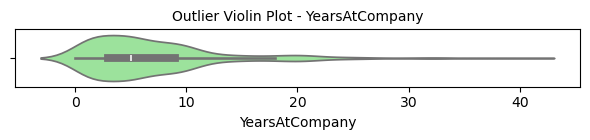

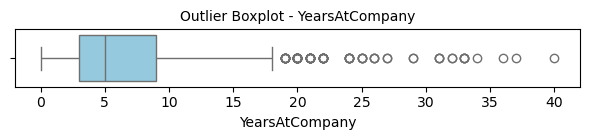


[OUTLIER] 'YearsInCurrentRole' — 15 values detected
   Q1 = 2.00, Median = 3.00, Q3 = 7.00
   Lower bound = -5.50, Upper bound = 14.50
   Values:
  { 15: 5x, 16: 6x, 17: 2x, 18: 2x }


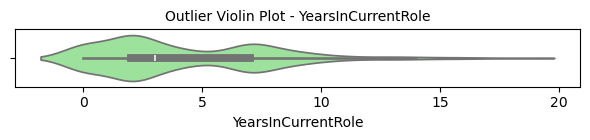

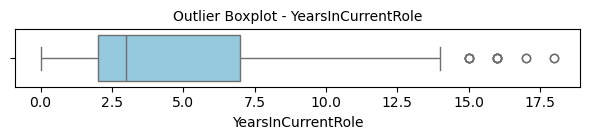


[OUTLIER] 'YearsSinceLastPromotion' — 80 values detected
   Q1 = 0.00, Median = 1.00, Q3 = 3.00
   Lower bound = -4.50, Upper bound = 7.50
   Values:
  { 8: 11x, 9: 14x, 10: 5x, 11: 21x, 12: 6x, 13: 7x, 14: 3x, 15: 13x }


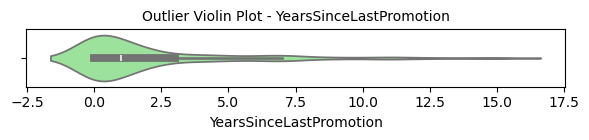

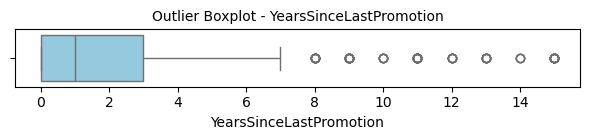


[OUTLIER] 'YearsWithCurrManager' — 12 values detected
   Q1 = 2.00, Median = 3.00, Q3 = 7.00
   Lower bound = -5.50, Upper bound = 14.50
   Values:
  { 15: 5x, 16: 1x, 17: 6x }


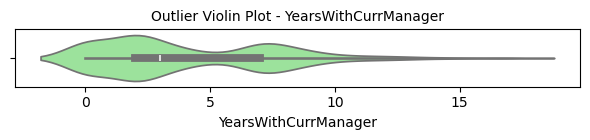

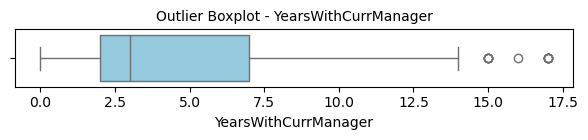

In [12]:
# Identify outliers using the Interquartile Range (IQR) method.
from scripts.runPlot_DetectOutliersIQR import plot_detect_outliers_iqr

print("\nOutliers detected using IQR method:\n")
ignore_outlier_cols = ['Attrition']
plot_detect_outliers_iqr(df=employee_df_clean, ignore_cols=ignore_outlier_cols)

#### Creating a new dataframe for data plotting needs

In [13]:
employee_plot = employee_df_clean.copy()

# list of numeric columns
numeric_cols = employee_df_clean.select_dtypes(include=['number']).columns.tolist()
numeric_cols = pd.Index(numeric_cols)
print(numeric_cols)

# list of category columns
categorical_cols = employee_df_clean.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()
categorical_cols.remove('EmployeeId')
categorical_cols = pd.Index(categorical_cols)
print(categorical_cols)

label_map = {
    0: 'Active',
    1: 'Resigned'
}

education_map = {
    "1": "1-Below College",
    "2": "2-College",
    "3": "3-Bachelor",
    "4": "4-Master",
    "5": "5-Doctor"
}

env_satisfaction_map = {
    "1": "1-Low",
    "2": "2-Medium",
    "3": "3-High",
    "4": "4-Very High"
}

job_involvement_map = {
    "1": "1-Low",
    "2": "2-Medium",
    "3": "3-High",
    "4": "4-Very High"
}

job_level_map = {
    "1": "1-Entry Level",
    "2": "2-Junior",
    "3": "3-Mid Level",
    "4": "4-Senior",
    "5": "5-Executive/Top Level"
}

job_satisfaction_map = {
    "1": "1-Low",
    "2": "2-Medium",
    "3": "3-High",
    "4": "4-Very High"
}

performance_rating_map = {
    "1": "1-Low",
    "2": "2-Good",
    "3": "3-Excellent",
    "4": "4-Outstanding"
}

relationship_satisfaction_map = {
    "1": "1-Low",
    "2": "2-Medium",
    "3": "3-High",
    "4": "4-Very High"
}

stock_option_level_map = {
    "0": "0-None",
    "1": "1-Low",
    "2": "2-Medium",
    "3": "3-High"
}

work_life_balance_map = {
    "1": "1-Low",
    "2": "2-Good",
    "3": "3-Excellent",
    "4": "4-Outstanding"
}

employee_plot["Education"] = employee_plot["Education"].astype(str).map(education_map)
employee_plot["EnvironmentSatisfaction"] = employee_plot["EnvironmentSatisfaction"].astype(str).map(env_satisfaction_map)
employee_plot["JobLevel"] = employee_plot["JobLevel"].astype(str).map(job_level_map)
employee_plot["JobInvolvement"] = employee_plot["JobInvolvement"].astype(str).map(job_involvement_map)
employee_plot["JobSatisfaction"] = employee_plot["JobSatisfaction"].astype(str).map(job_satisfaction_map)
employee_plot["PerformanceRating"] = employee_plot["PerformanceRating"].astype(str).map(performance_rating_map)
employee_plot["RelationshipSatisfaction"] = employee_plot["RelationshipSatisfaction"].astype(str).map(relationship_satisfaction_map)
employee_plot["StockOptionLevel"] = employee_plot["StockOptionLevel"].astype(str).map(stock_option_level_map)
employee_plot["WorkLifeBalance"] = employee_plot["WorkLifeBalance"].astype(str).map(work_life_balance_map)

employee_plot.info()

Index(['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'HourlyRate',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')
Index(['BusinessTravel', 'Department', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
       'JobRole', 'JobSatisfaction', 'MaritalStatus', 'OverTime',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'WorkLifeBalance'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
Index: 1058 entries, 1 to 1469
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   EmployeeId                1058 non-null   object  
 1   Age                       1058 non-null   int64   
 2

#### Descriptive Statistics "employee_df"

In [14]:
# Descriptive statistics
print("\nDescriptive statistics of numeric category columns:")
display(employee_df[numeric_cols].describe())

# Descriptive statistics for the category column
print("\nDescriptive statistics for the category column:")
display(employee_df[categorical_cols].describe(include='all'))


Descriptive statistics of numeric category columns:


,Age,Attrition,DailyRate,DistanceFromHome,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1058.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,0.169187,802.485714,9.192517,65.891156,6502.931293,14313.103401,2.693197,15.209524,11.279592,2.799320,7.008163,4.229252,2.187755,4.123129
std,9.135373,0.375094,403.509100,8.106864,20.329428,4707.956783,7117.786044,2.498009,3.659938,7.780782,1.289271,6.126525,3.623137,3.222430,3.568136
min,18.000000,0.000000,102.000000,1.000000,30.000000,1009.000000,2094.000000,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,465.000000,2.000000,48.000000,2911.000000,8047.000000,1.000000,12.000000,6.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,0.000000,802.000000,7.000000,66.000000,4919.000000,14235.500000,2.000000,14.000000,10.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,0.000000,1157.000000,14.000000,83.750000,8379.000000,20461.500000,4.000000,18.000000,15.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1.000000,1499.000000,29.000000,100.000000,19999.000000,26999.000000,9.000000,25.000000,40.000000,6.000000,40.000000,18.000000,15.000000,17.000000



Descriptive statistics for the category column:


,BusinessTravel,Department,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,OverTime,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance
count,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470
unique,3,3,5,6,4,2,4,5,9,4,3,2,2,4,4,4
top,Travel_Rarely,Research & Development,3,Life Sciences,3,Male,3,1,Sales Executive,4,Married,No,3,3,0,3
freq,1043,961,572,606,453,882,868,543,326,459,673,1054,1244,459,631,893


#### Plot data

##### Hitogram Plot

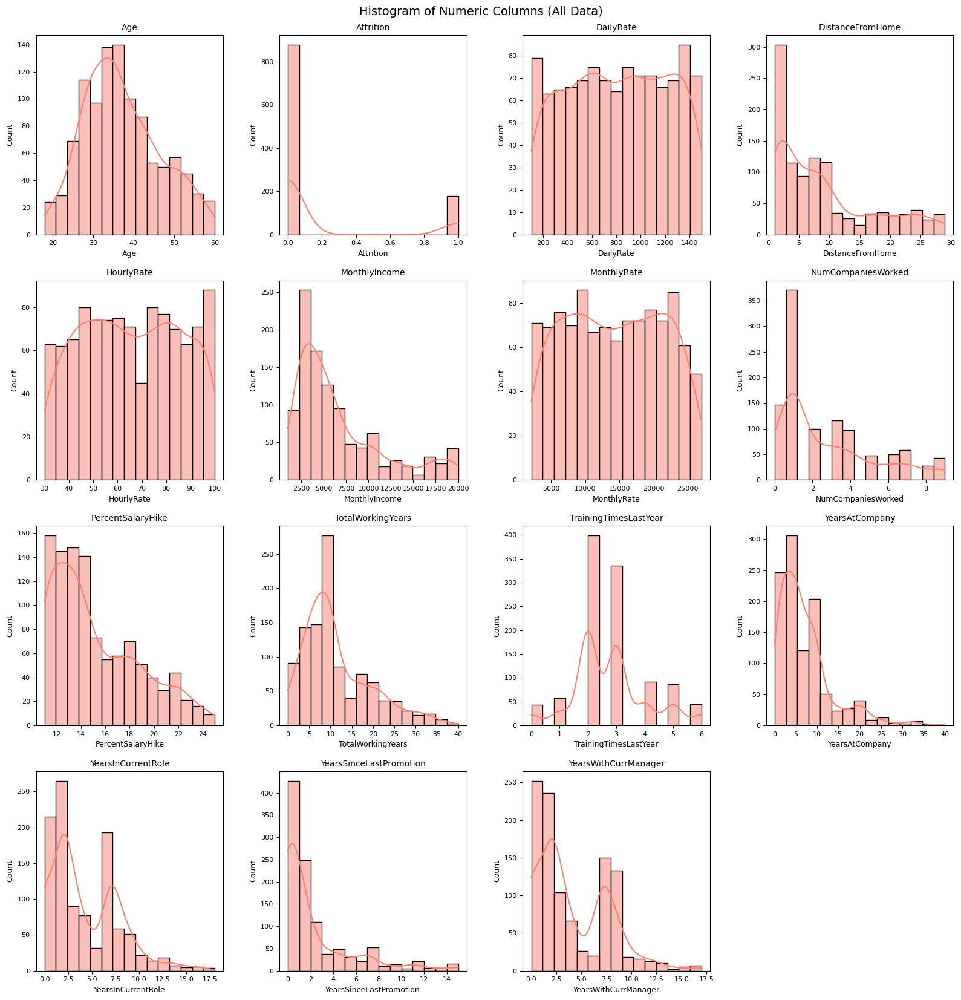

In [15]:
from scripts.runPlot_ObsHistNumeric import plot_obs_histnums
plot_obs_histnums(df=employee_plot, numeric_cols=numeric_cols, n_cols=4, color='salmon')

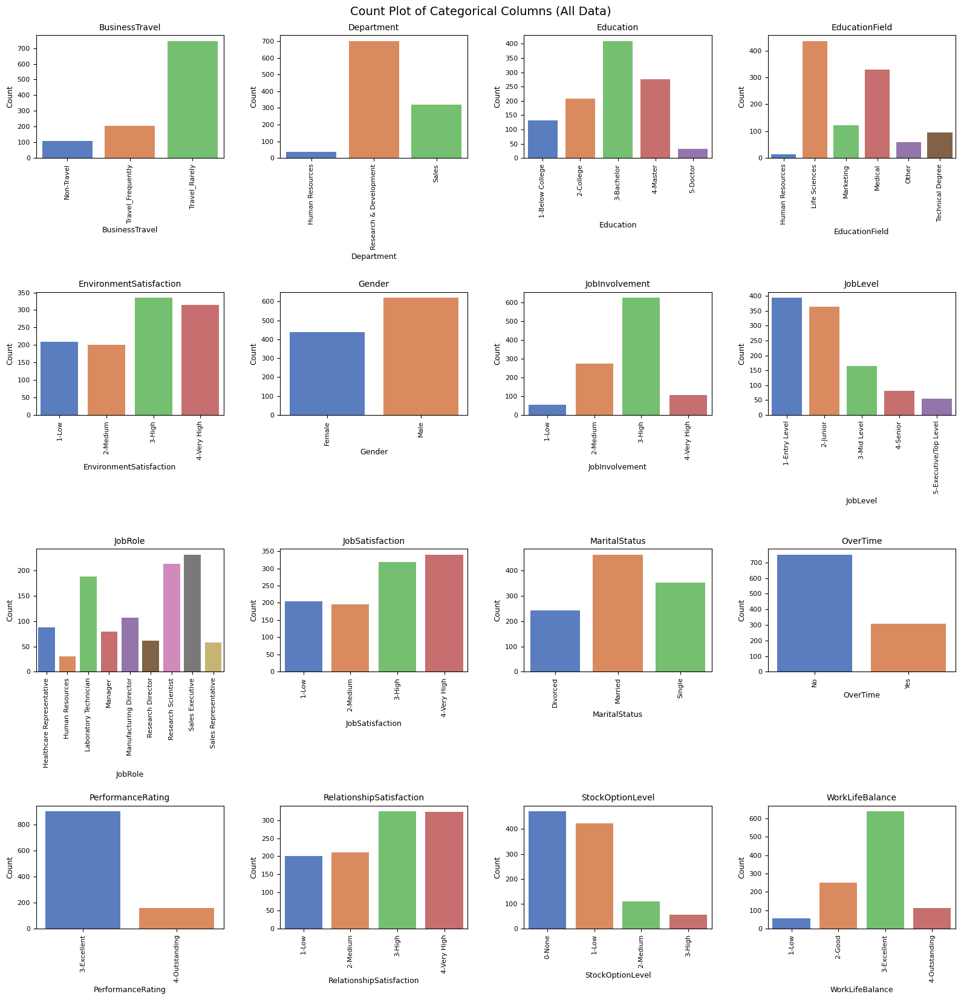

In [16]:
from scripts.runPlot_ObsHistCatgs import plot_obs_histcatgs
plot_obs_histcatgs(df=employee_plot, categorical_cols=categorical_cols, n_cols=4)

##### Pair plot

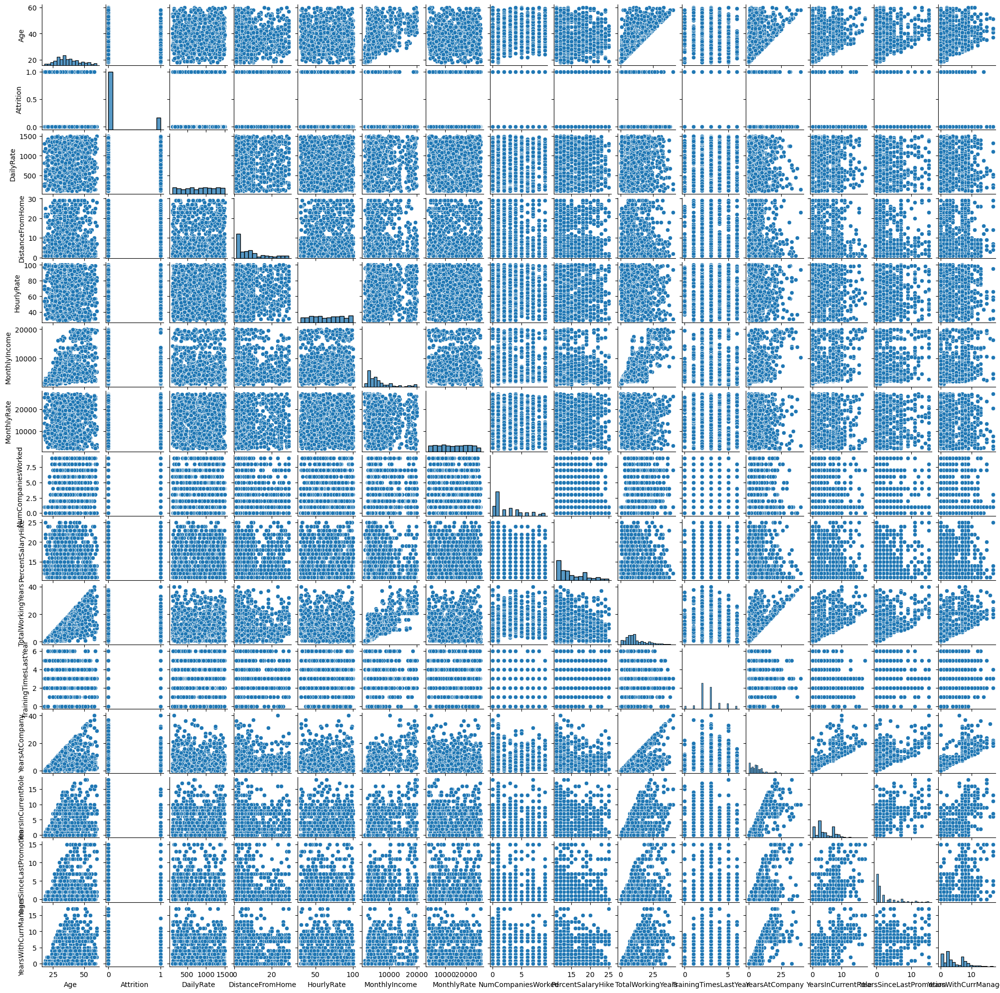

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Creating a scatter matrix (pair plot)
g = sns.pairplot(employee_plot, vars=numeric_cols)
# Ganti ukuran figure secara manual
g.fig.set_size_inches(20, 20)  # (lebar, tinggi)
plt.show()

##### Correlation Headmap

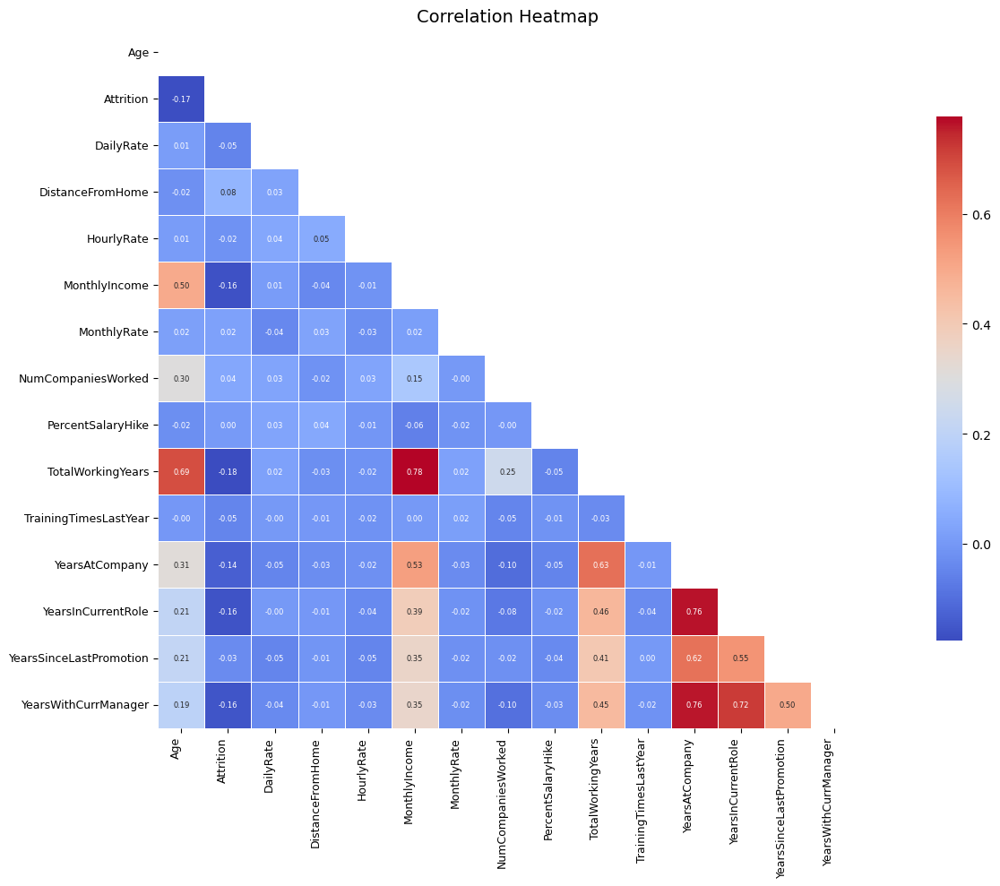

In [18]:
from scripts.runPlot_ObsCorrHeatmap import plot_obs_corrheatmap
plot_obs_corrheatmap(employee_plot, columns=numeric_cols,figsize=(18, 10))

##### Box Plot

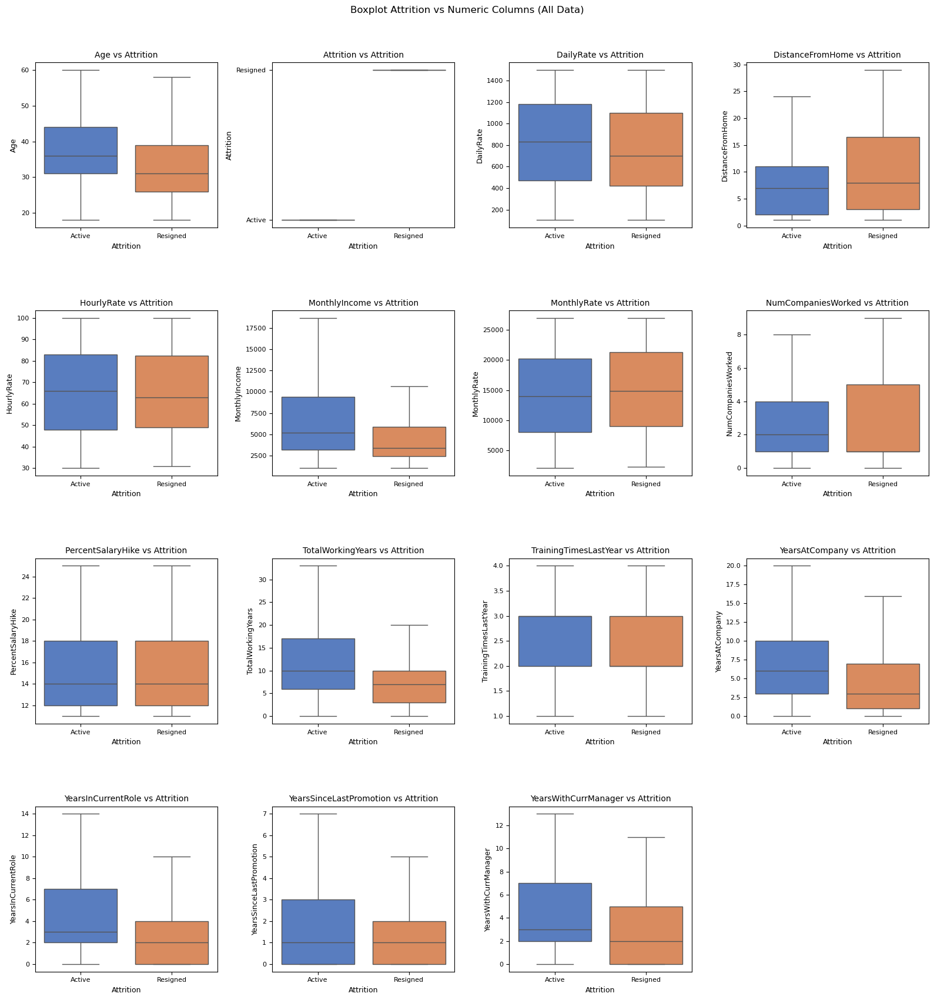

In [19]:
from scripts.runPlot_ObsBoxCols import plot_obs_boxcols
plot_obs_boxcols(employee_plot, numeric_cols=numeric_cols, col_target='Attrition', label_map=label_map, n_cols=4)

##### Count Plot

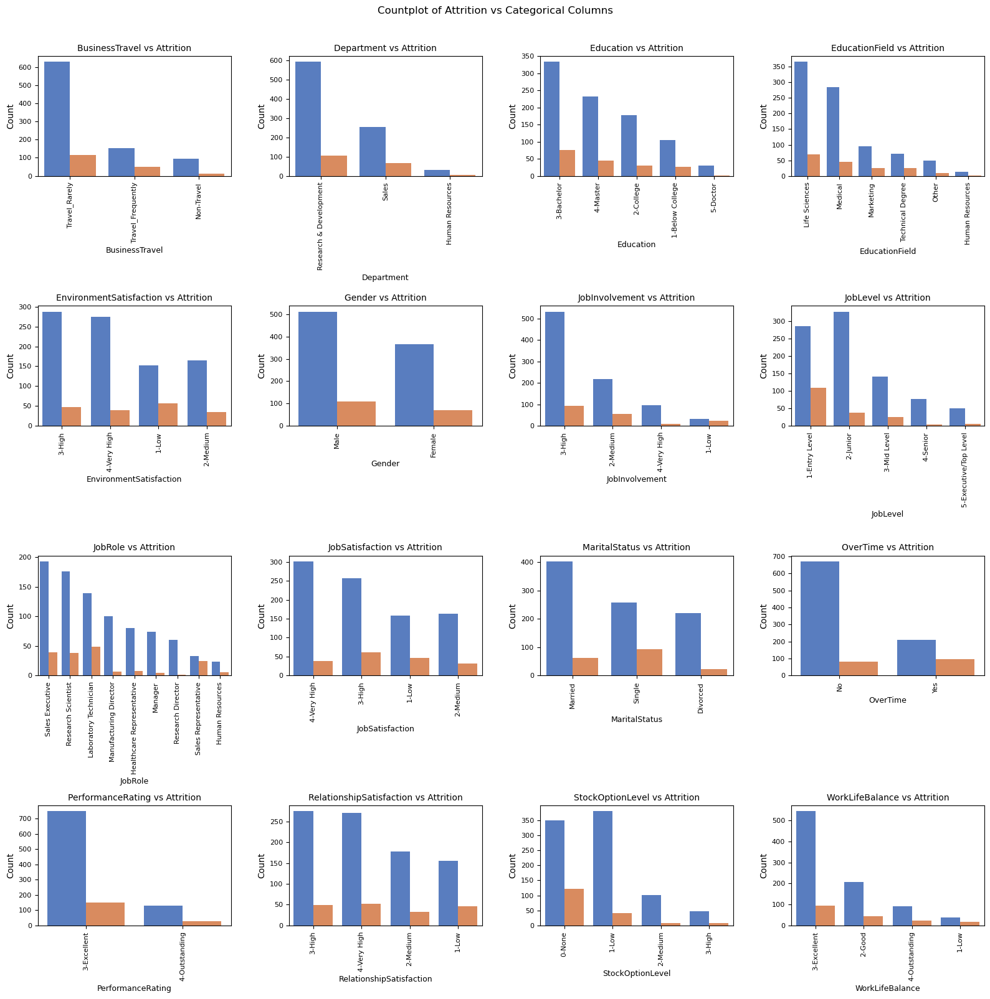

In [20]:
from scripts.runPlot_ObsCountCols import plot_obs_countcols
plot_obs_countcols(df=employee_plot, categorical_cols=categorical_cols, col_target='Attrition', n_cols=4,legend_show=False,label_map=label_map)

##### Line plot

In [21]:
from scripts.runPlot_ObsLineXYcMetricSubplot import plot_obs_lineXYc_metric_subplot
from scripts.runPlot_ObsHitsXYcMetricSubplot import plot_obs_histXYc_metric_subplot


XcolsList = [col for col in categorical_cols if col != 'Attrition'] + [col for col in numeric_cols if col != 'Attrition']
XcolsList.sort()
print("columns List to plot:")
print(XcolsList)

columns List to plot:
['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome', 'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


------------ Metric Plot: Count Plot ------------


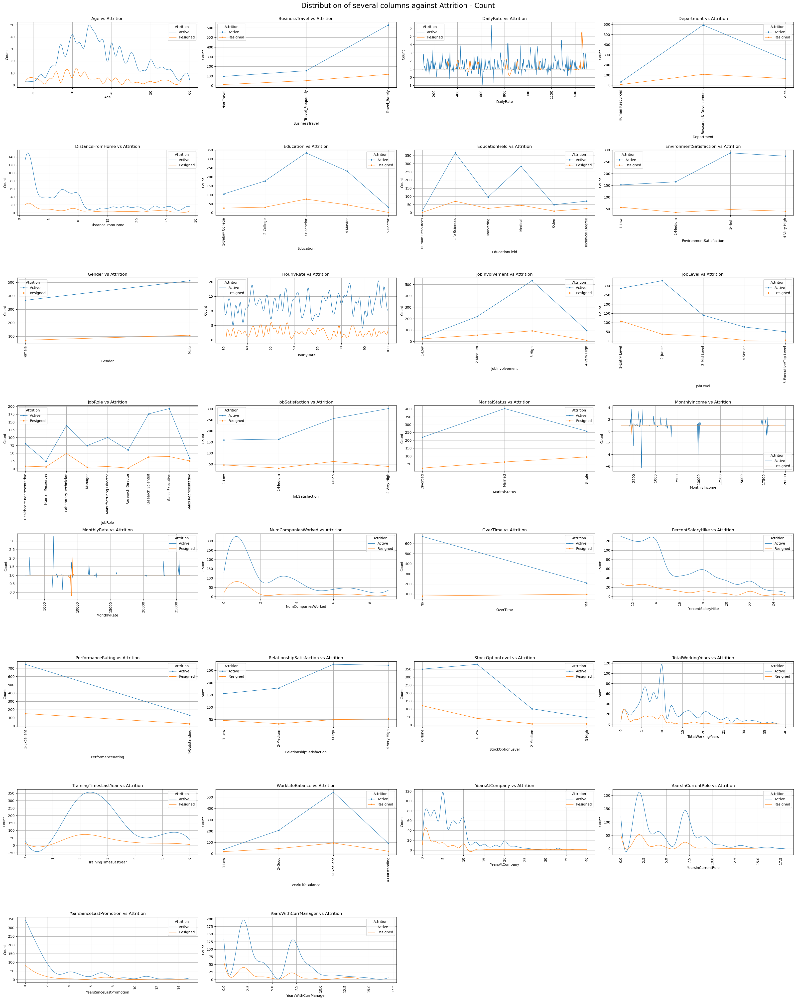

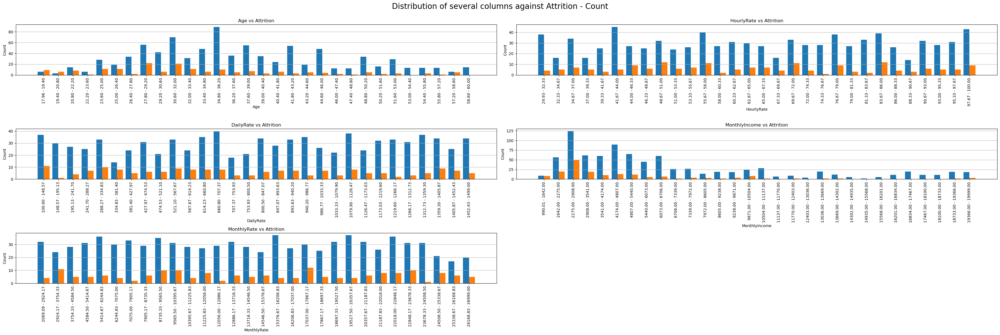

------------ Metric Plot: niMax Normalization Plot ------------


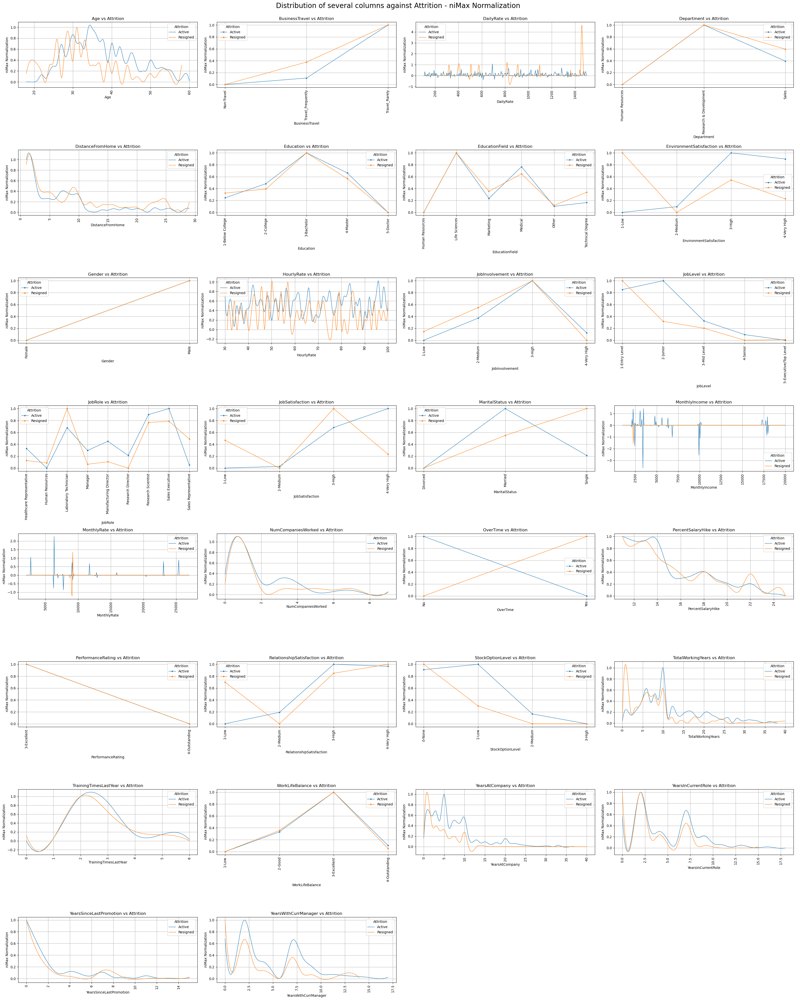

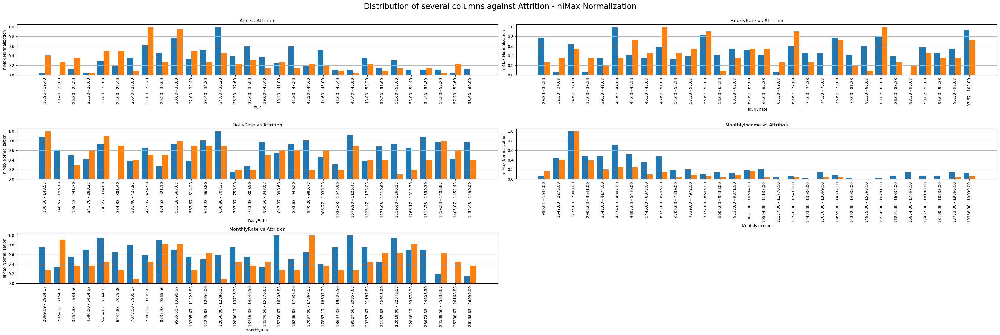

------------ Metric Plot: Rangking Metric Plot ------------


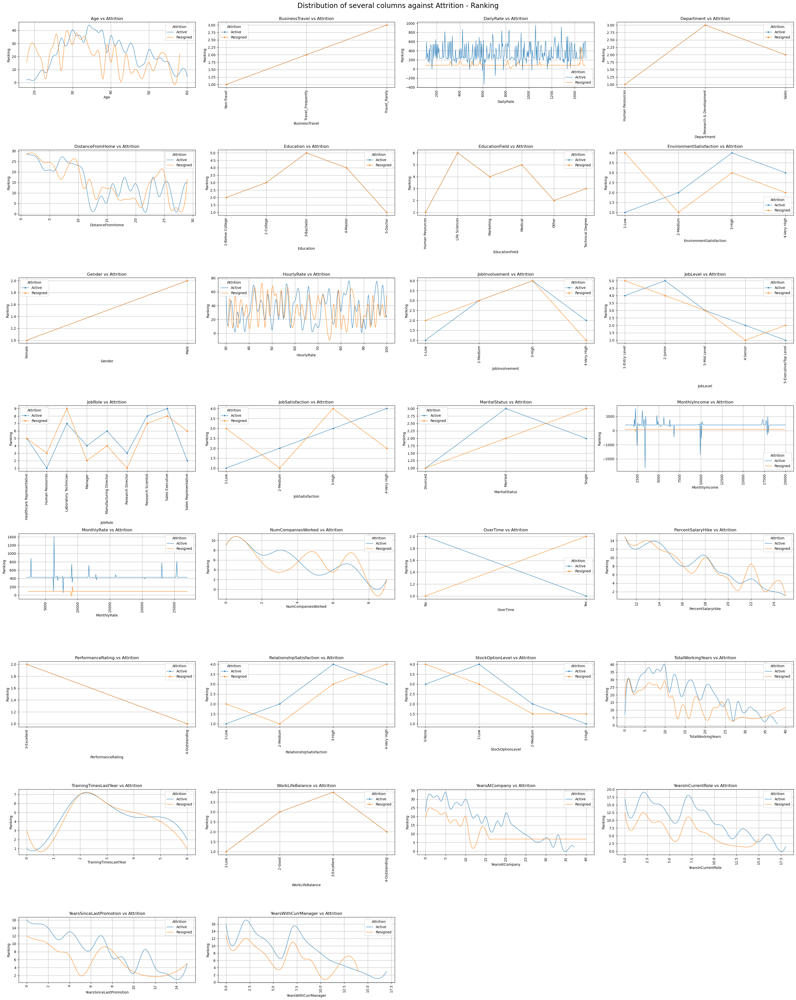

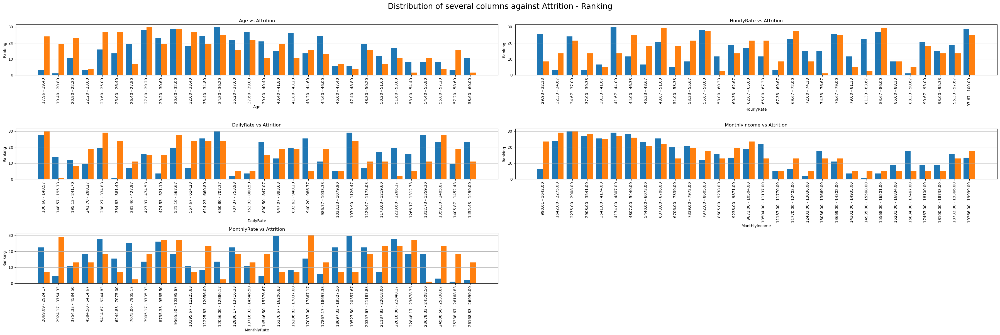

------------ Metric Plot: Percentage Contribution Metric Plot ------------


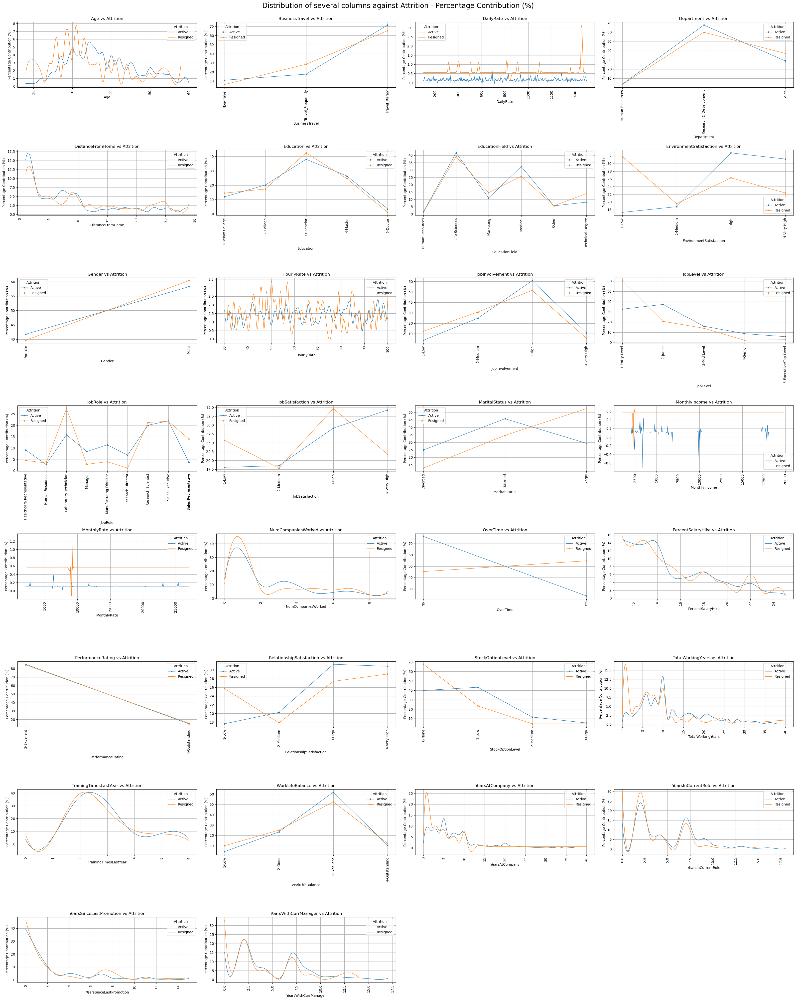

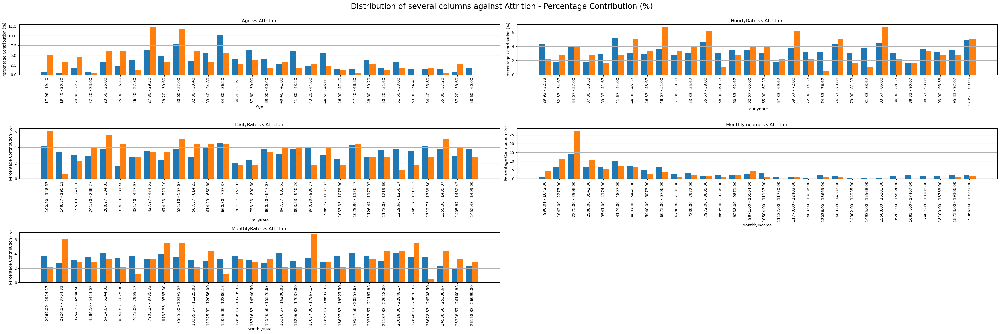

In [22]:
YCol = "Attrition"
Xline_smooth =  True
rotation_label = 90
metric_types = ["count","nimax","rank","catg_contrib"]
continue_cols=["Age", "HourlyRate","DailyRate", "MonthlyIncome","MonthlyRate"]
metric_types_map = {
    "count": "Count Plot",
    "nimax": "niMax Normalization Plot",
    "rank": "Rangking Metric Plot",
    "catg_contrib": "Percentage Contribution Metric Plot"
}


for metric_type in metric_types:
    print(f"------------ Metric Plot: {metric_types_map[metric_type]} ------------")

    plot_obs_lineXYc_metric_subplot(
        employee_plot,
        Xcols=XcolsList,
        lineCol=YCol,
        n_cols=4,
        ignore_cols=None,
        label_map=label_map,
        line_smooth=Xline_smooth,
        rotation_label=rotation_label,
        height_per_plot=5,
        legend_show=True,
        metric_type=metric_type)

    plot_obs_histXYc_metric_subplot(
        employee_plot,
        Xcols=continue_cols,
        barCol=YCol,
        metric_type=metric_type,
        label_map=label_map,
        n_cols=2,
        width_per_plot=18,
        height_per_plot=4,
        rotation_label=rotation_label,
        bins=30,
        legend_show=False)

#### Saving the dataframe to a dataset file

In [ ]:
employee_df_clean.to_parquet("saved/employee_cleaned.parquet", index=False)
employee_plot.to_csv("saved/employee_plot.csv", index=False)

### Modeling

#### Encoding

In [ ]:
from sklearn.preprocessing import LabelEncoder

print(categorical_cols)

employee_df_encode = employee_df_clean.copy()

le = LabelEncoder()
for col in categorical_cols:
    employee_df_encode[col] = le.fit_transform(employee_df_encode[col])

Index(['BusinessTravel', 'Department', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
       'JobRole', 'JobSatisfaction', 'MaritalStatus', 'OverTime',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'WorkLifeBalance'],
      dtype='object')


#### Split feature data and target data

In [ ]:
X = employee_df_encode.drop(columns=['EmployeeId','Attrition'])
y = employee_df_encode['Attrition']

#### Building a Model

##### import def function to support the process.

In [ ]:
from scripts.runModelSuprt import *

resultRunModel_df = newDf_logModel()
models_path = "__models__/"

#### **Running the Model**

##### **Logistic Regression**


In [ ]:
# import script runModel
from scripts.runModel_LogRegression import *

# running several model trainings
#------------------
setModelRun = {
    "IdRun": "LR01",
    "options": {"scheme":20},
    "Params": {"modelParams":{"random_state": 24}}
}

# Simulation model, runModel_LogRegression
setModel_Output, model_output = runModel_LogRegression(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Logistic Regression")


#------------------
setModelRun = {
    "IdRun": "LR02",
    "options": {"scheme":30},
    "Params": {"modelParams":{"random_state": 24}}
}

# Simulation model, runModel_LogRegression
setModel_Output, model_output = runModel_LogRegression(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Logistic Regression")


#------------------
setModelRun = {
    "IdRun": "LR03",
    "options": {"scheme":30,"gridSCV": True},
    "Params": {"modelParams":{"random_state": 24}}
}

# Simulation model, runModel_LogRegression
setModel_Output, model_output = runModel_LogRegression(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Logistic Regression")


#------------------
setModelRun = {
    "IdRun": "LR04",
    "options": {"scheme":30,"randSCV": True},
    "Params": {"modelParams":{"random_state": 24}}
}

# Simulation model, runModel_LogRegression
setModel_Output, model_output = runModel_LogRegression(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Logistic Regression")

,ModelName,IdRun,DateAction,options,Params,Remarks,AccuracyTrain,AccuracyTest,F1ScoreTest,PrecisionTest,RecallTest
0,Logistic Regression,LR01,2025-05-08 03:01:02,{'scheme': 20},{'modelParams': {'random_state': 24}},NaN,0.836879,0.820755,0.744482,0.853036,0.820755
1,Logistic Regression,LR02,2025-05-08 03:01:02,{'scheme': 30},{'modelParams': {'random_state': 24}},NaN,0.833784,0.836478,0.770531,0.863472,0.836478
2,Logistic Regression,LR03,2025-05-08 03:01:07,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 24, 'n_jobs': 2}, 'BestParamsGridSCV': {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}}",NaN,0.862162,0.880503,0.852995,0.895589,0.880503
3,Logistic Regression,LR04,2025-05-08 03:01:10,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'max_iter': 500, 'random_state': 24}, 'BestParamsRandSCV': {'C': 0.13292918943162169, 'penalty': 'l1', 'solver': 'liblinear'}}",NaN,0.855405,0.874214,0.845258,0.882668,0.874214


##### Random Forest

In [ ]:
# import script runModel
from scripts.runModel_RandomForest import *

# Running multiple models
#------------------

setModelRun = {
    "IdRun": "RF01",
    "options": {"scheme":20},
    "Params": {"modelParams":{"random_state": 24}}
}

# Model simulation, runModel_RandomForest
setModel_Output, model_output = runModel_RandomForest(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Random Forest")


#------------------
setModelRun = {
    "IdRun": "RF02",
    "options": {"scheme":30},
    "Params": {"modelParams":{"random_state": 24}}
}

# Model simulation, runModel_RandomForest
setModel_Output, model_output = runModel_RandomForest(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Random Forest")


#------------------
setModelRun = {
    "IdRun": "RF03",
    "options": {"scheme":30,"gridSCV": True},
}

# Model simulation, runModel_RandomForest
setModel_Output, model_output = runModel_RandomForest(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Random Forest")


#------------------
setModelRun = {
    "IdRun": "RF04",
    "options": {"scheme":30,"randSCV": True},
}

# Model simulation, runModel_RandomForest
setModel_Output, model_output = runModel_RandomForest(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Random Forest")

,ModelName,IdRun,DateAction,options,Params,Remarks,AccuracyTrain,AccuracyTest,F1ScoreTest,PrecisionTest,RecallTest
4,Random Forest,RF01,2025-05-08 03:01:11,{'scheme': 20},"{'modelParams': {'n_jobs': 2, 'random_state': 24}}",NaN,1.000000,0.849057,0.802944,0.872618,0.849057
5,Random Forest,RF02,2025-05-08 03:01:12,{'scheme': 30},"{'modelParams': {'n_jobs': 2, 'random_state': 24}}",NaN,1.000000,0.861635,0.820854,0.881466,0.861635
6,Random Forest,RF03,2025-05-08 03:06:12,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 42, 'n_jobs': 2}, 'BestParamsGridSCV': {'max_depth': 20, 'max_features': 0.5, 'min_samples_leaf': 1, 'min_samples_split': 15, 'n_estimators': 500}}",NaN,0.935135,0.855346,0.812711,0.863049,0.855346
7,Random Forest,RF04,2025-05-08 03:06:18,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'random_state': 42, 'n_jobs': 2}, 'BestParamsRandSCV': {'n_estimators': 50, 'min_samples_split': 2, 'max_depth': 10}}",NaN,0.993243,0.849057,0.800881,0.854986,0.849057


##### Decision Tree

In [ ]:
# import script runModel
from scripts.runModel_DecisionTree import *

# Running several training models
#------------------
setModelRun = {
    "IdRun": "DF01",
    "options": {"scheme":20},
}

# Simulation model, runModel_DecisionTree
setModel_Output, model_output = runModel_DecisionTree(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "DecisionTree Classifier")


#------------------
setModelRun = {
    "IdRun": "DF02",
    "options": {"scheme":30},
}

# Simulation model, runModel_DecisionTree
setModel_Output, model_output = runModel_DecisionTree(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "DecisionTree Classifier")


#------------------
setModelRun = {
    "IdRun": "DF03",
    "options": {"scheme":30,"gridSCV": True},
}

# Simulation model, runModel_DecisionTree
setModel_Output, model_output = runModel_DecisionTree(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "DecisionTree Classifier")


#------------------
setModelRun = {
    "IdRun": "DF04",
    "options": {"scheme":30,"randSCV": True},
}

# Simulation model, runModel_DecisionTree
setModel_Output, model_output = runModel_DecisionTree(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "DecisionTree Classifier")

,ModelName,IdRun,DateAction,options,Params,Remarks,AccuracyTrain,AccuracyTest,F1ScoreTest,PrecisionTest,RecallTest
0,DecisionTree Classifier,DF01,2025-05-08 03:06:18,{'scheme': 20},{'modelParams': {'random_state': 42}},NaN,1.000000,0.764151,0.750122,0.739353,0.764151
1,DecisionTree Classifier,DF02,2025-05-08 03:06:18,{'scheme': 30},{'modelParams': {'random_state': 42}},NaN,1.000000,0.783019,0.783790,0.784576,0.783019
2,DecisionTree Classifier,DF03,2025-05-08 03:06:23,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsGridSCV': {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2}}",NaN,0.964865,0.811321,0.793812,0.784271,0.811321
3,DecisionTree Classifier,DF04,2025-05-08 03:06:23,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsRandSCV': {'criterion': 'entropy', 'max_depth': 2, 'min_samples_leaf': 8, 'min_samples_split': 13}}",NaN,0.836486,0.858491,0.838929,0.841739,0.858491


##### AdaBoost (Adaptive Boosting)

In [ ]:
from scripts.runModel_Adaboost import *


# Running several training models
#------------------
setModelRun = {
    "IdRun": "AD01",
    "options": {"scheme":20},
}

# Model simulation, runModel_Adaboost
setModel_Output, model_output = runModel_Adaboost(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Adaboost Classifier")


#------------------
setModelRun = {
    "IdRun": "AD02",
    "options": {"scheme":30},
}

# Model simulation, runModel_Adaboost
setModel_Output, model_output = runModel_Adaboost(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Adaboost Classifier")


#------------------
setModelRun = {
    "IdRun": "AD03",
    "options": {"scheme":30,"gridSCV": True},
}

# Model simulation, runModel_Adaboost
setModel_Output, model_output = runModel_Adaboost(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Adaboost Classifier")


#------------------
setModelRun = {
    "IdRun": "AD04",
    "options": {"scheme":30,"randSCV": True},
}

# Model simulation, runModel_Adaboost
setModel_Output, model_output = runModel_Adaboost(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Adaboost Classifier")

,ModelName,IdRun,DateAction,options,Params,Remarks,AccuracyTrain,AccuracyTest,F1ScoreTest,PrecisionTest,RecallTest
0,Adaboost Classifier,AD01,2025-05-08 03:06:24,{'scheme': 20},{'modelParams': {'random_state': 42}},NaN,0.875887,0.853774,0.834035,0.838556,0.853774
1,Adaboost Classifier,AD02,2025-05-08 03:06:24,{'scheme': 30},{'modelParams': {'random_state': 42}},NaN,0.870270,0.867925,0.840028,0.864816,0.867925
2,Adaboost Classifier,AD03,2025-05-08 03:06:39,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsGridSCV': {'learning_rate': 1.0, 'n_estimators': 50}}",NaN,0.870270,0.867925,0.840028,0.864816,0.867925
3,Adaboost Classifier,AD04,2025-05-08 03:06:50,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsRandSCV': {'learning_rate': 0.7319987722668247, 'n_estimators': 79}}",NaN,0.871622,0.874214,0.845258,0.882668,0.874214


##### Gradient Boosting

In [ ]:
from scripts.runModel_GradientBoosting import *

# Running several training models
#------------------
setModelRun = {
    "IdRun": "GB01",
    "options": {"scheme":20},
}

# Model simulation, runModel_GradientBoosting
setModel_Output, model_output = runModel_GradientBoosting(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Gradient Boosting")


#------------------
setModelRun = {
    "IdRun": "GB02",
    "options": {"scheme":30},
}

# Model simulation, runModel_GradientBoosting
setModel_Output, model_output = runModel_GradientBoosting(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Gradient Boosting")


#------------------
setModelRun = {
    "IdRun": "GB03",
    "options": {"scheme":30,"gridSCV": True},
}

# Model simulation, runModel_GradientBoosting
setModel_Output, model_output = runModel_GradientBoosting(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Gradient Boosting")


#------------------
setModelRun = {
    "IdRun": "GB04",
    "options": {"scheme":30,"randSCV": True},
}

# Model simulation, runModel_GradientBoosting
setModel_Output, model_output = runModel_GradientBoosting(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Gradient Boosting")

,ModelName,IdRun,DateAction,options,Params,Remarks,AccuracyTrain,AccuracyTest,F1ScoreTest,PrecisionTest,RecallTest
8,Gradient Boosting,GB01,2025-05-08 03:06:51,{'scheme': 20},{'modelParams': {'random_state': 42}},NaN,0.971631,0.849057,0.816596,0.838627,0.849057
9,Gradient Boosting,GB02,2025-05-08 03:06:51,{'scheme': 30},{'modelParams': {'random_state': 42}},NaN,0.977027,0.852201,0.824893,0.833206,0.852201
10,Gradient Boosting,GB03,2025-05-08 03:08:31,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsGridSCV': {'learning_rate': 0.5, 'max_depth': 5, 'n_estimators': 50}}",NaN,1.000000,0.858491,0.840891,0.841839,0.858491
11,Gradient Boosting,GB04,2025-05-08 03:08:46,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsRandSCV': {'learning_rate': 0.19727005942368125, 'max_depth': 3, 'n_estimators': 64}}",NaN,0.985135,0.871069,0.851357,0.860955,0.871069


##### Support Vector Machines (SVM)

In [ ]:
from scripts.runModel_SVM import *

# Running several training models
#------------------
setModelRun = {
    "IdRun": "SV01",
    "options": {"scheme":20},
}

# Model simulation, runModel_SVM
setModel_Output, model_output = runModel_SVM(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Support Vector Machine")


#------------------
setModelRun = {
    "IdRun": "SV02",
    "options": {"scheme":30},
}

# Model simulation, runModel_SVM
setModel_Output, model_output = runModel_SVM(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Support Vector Machine")


,ModelName,IdRun,DateAction,options,Params,Remarks,AccuracyTrain,AccuracyTest,F1ScoreTest,PrecisionTest,RecallTest
20,Support Vector Machine,SV01,2025-05-08 03:08:47,{'scheme': 20},{'modelParams': {'probability': True}},NaN,0.834515,0.816038,0.733374,0.665918,0.816038
21,Support Vector Machine,SV02,2025-05-08 03:08:48,{'scheme': 30},{'modelParams': {'probability': True}},NaN,0.832432,0.827044,0.748752,0.684002,0.827044


##### K-Nearest Neighbors (KNN)

In [ ]:
from scripts.runModel_KNN import *


# Running several training models
#------------------
setModelRun = {
    "IdRun": "KN01",
    "options": {"scheme":20},
}

# Model simulation, runModel_KNN
setModel_Output, model_output = runModel_KNN(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "K-Nearest Neighbors")


#------------------
setModelRun = {
    "IdRun": "KN02",
    "options": {"scheme":30},
}

# Model simulation, runModel_KNN
setModel_Output, model_output = runModel_KNN(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "K-Nearest Neighbors")


#------------------
setModelRun = {
    "IdRun": "KN03",
    "options": {"scheme":30,"gridSCV": True},
}

# Model simulation, runModel_KNN
setModel_Output, model_output = runModel_KNN(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "K-Nearest Neighbors")


#------------------
setModelRun = {
    "IdRun": "KN04",
    "options": {"scheme":30,"randSCV": True},
}

# Model simulation, runModel_KNN
setModel_Output, model_output = runModel_KNN(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "K-Nearest Neighbors")

,ModelName,IdRun,DateAction,options,Params,Remarks,AccuracyTrain,AccuracyTest,F1ScoreTest,PrecisionTest,RecallTest
12,K-Nearest Neighbors,KN01,2025-05-08 03:08:48,{'scheme': 20},{'modelParams': {}},NaN,0.855792,0.816038,0.774000,0.773373,0.816038
13,K-Nearest Neighbors,KN02,2025-05-08 03:08:49,{'scheme': 30},{'modelParams': {}},NaN,0.848649,0.814465,0.766051,0.752787,0.814465
14,K-Nearest Neighbors,KN03,2025-05-08 03:08:50,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {}, 'BestParamsGridSCV': {'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'uniform'}}",NaN,0.841892,0.823899,0.747192,0.683551,0.823899
15,K-Nearest Neighbors,KN04,2025-05-08 03:08:51,"{'scheme': 30, 'randSCV': True}","{'modelParams': {}, 'BestParamsRandSCV': {'metric': 'manhattan', 'n_neighbors': 14, 'weights': 'uniform'}}",NaN,0.832432,0.827044,0.748752,0.684002,0.827044


##### XGBoost (Extreme Gradient Boosting)

In [ ]:
from scripts.runModel_XGBoost import *

# Running several training models
#------------------
setModelRun = {
    "IdRun": "XG01",
    "options": {"scheme":20},
}

# Model simulation, runModel_XGBoost
setModel_Output, model_output = runModel_XGBoost(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "XGBoost")


#------------------
setModelRun = {
    "IdRun": "XG02",
    "options": {"scheme":30},
}

# Model simulation, runModel_XGBoost
setModel_Output, model_output = runModel_XGBoost(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "XGBoost")


#------------------
setModelRun = {
    "IdRun": "XG03",
    "options": {"scheme":30,"gridSCV": True},
}

# Model simulation, runModel_XGBoost
setModel_Output, model_output = runModel_XGBoost(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "XGBoost")


#------------------
setModelRun = {
    "IdRun": "XG04",
    "options": {"scheme":30,"randSCV": True},
}

# Model simulation, runModel_XGBoost
setModel_Output, model_output = runModel_XGBoost(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "XGBoost")

,ModelName,IdRun,DateAction,options,Params,Remarks,AccuracyTrain,AccuracyTest,F1ScoreTest,PrecisionTest,RecallTest
26,XGBoost,XG01,2025-05-08 03:08:52,{'scheme': 20},"{'modelParams': {'random_state': 42, 'use_label_encoder': False, 'eval_metric': 'mlogloss'}}",NaN,1.000000,0.839623,0.816353,0.818064,0.839623
27,XGBoost,XG02,2025-05-08 03:08:52,{'scheme': 30},"{'modelParams': {'random_state': 42, 'use_label_encoder': False, 'eval_metric': 'mlogloss'}}",NaN,1.000000,0.855346,0.836366,0.837337,0.855346
28,XGBoost,XG03,2025-05-08 03:09:52,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 42, 'use_label_encoder': False, 'eval_metric': 'mlogloss'}, 'BestParamsGridSCV': {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}}",NaN,0.914865,0.874214,0.849896,0.872260,0.874214
29,XGBoost,XG04,2025-05-08 03:10:01,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'random_state': 42, 'use_label_encoder': False, 'eval_metric': 'mlogloss'}, 'BestParamsRandSCV': {'learning_rate': 0.29156581270472504, 'max_depth': 4, 'n_estimators': 70, 'subsample': 0.8852444528883149}}",NaN,1.000000,0.874214,0.855917,0.864935,0.874214


##### Multi-Layer Perceptron (MLP) – Neural Network

In [ ]:
from scripts.runModel_MLP import *


# Running several training models
#------------------
setModelRun = {
    "IdRun": "MP01",
    "options": {"scheme":20},
}

# Model simulation, runModel_MLP
setModel_Output, model_output = runModel_MLP(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Multi-Layer Perceptron")


#------------------
setModelRun = {
    "IdRun": "MP02",
    "options": {"scheme":30},
}

# Model simulation, runModel_MLP
setModel_Output, model_output = runModel_MLP(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Multi-Layer Perceptron")


#------------------
setModelRun = {
    "IdRun": "MP03",
    "options": {"scheme":30,"gridSCV": True},
}

# Model simulation, runModel_MLP
setModel_Output, model_output = runModel_MLP(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Multi-Layer Perceptron")


#------------------
setModelRun = {
    "IdRun": "MP04",
    "options": {"scheme":30,"randSCV": True},
}

# Model simulation, runModel_MLP
setModel_Output, model_output = runModel_MLP(setModelRun, X, y)

# Set the Log dataframe and save the model
resultRunModel_df = updateRunModelDf(df=resultRunModel_df, setx=setModel_Output, model=model_output, models_path=models_path)
showResultDfModel(resultRunModel_df, ModelName = "Multi-Layer Perceptron")

,ModelName,IdRun,DateAction,options,Params,Remarks,AccuracyTrain,AccuracyTest,F1ScoreTest,PrecisionTest,RecallTest
20,Multi-Layer Perceptron,MP01,2025-05-08 03:10:02,{'scheme': 20},"{'modelParams': {'max_iter': 300, 'random_state': 42}}",NaN,0.822695,0.811321,0.753680,0.751575,0.811321
21,Multi-Layer Perceptron,MP02,2025-05-08 03:10:02,{'scheme': 30},"{'modelParams': {'max_iter': 300, 'random_state': 42}}",NaN,0.831081,0.817610,0.744053,0.682640,0.817610
22,Multi-Layer Perceptron,MP03,2025-05-08 03:10:59,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'max_iter': 300, 'random_state': 42}, 'BestParamsGridSCV': {'activation': 'tanh', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'solver': 'adam'}}",NaN,0.832432,0.827044,0.748752,0.684002,0.827044
23,Multi-Layer Perceptron,MP04,2025-05-08 03:11:16,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'max_iter': 300, 'random_state': 42}, 'BestParamsRandSCV': {'activation': 'tanh', 'alpha': 0.006086584841970367, 'hidden_layer_sizes': (30, 30, 30), 'solver': 'sgd'}}",NaN,0.832432,0.827044,0.748752,0.684002,0.827044


#### Evaluation

In [ ]:
resultRunModel_df

,ModelName,IdRun,DateAction,options,Params,Remarks,AccuracyTrain,AccuracyTest,F1ScoreTest,PrecisionTest,RecallTest,ConfusionMatrix
0,Adaboost Classifier,AD01,2025-05-08 03:06:24,{'scheme': 20},{'modelParams': {'random_state': 42}},NaN,0.875887,0.853774,0.834035,0.838556,0.853774,"[[167, 6], [25, 14]]"
1,Adaboost Classifier,AD02,2025-05-08 03:06:24,{'scheme': 30},{'modelParams': {'random_state': 42}},NaN,0.870270,0.867925,0.840028,0.864816,0.867925,"[[260, 3], [39, 16]]"
2,Adaboost Classifier,AD03,2025-05-08 03:06:39,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsGridSCV': {'learning_rate': 1.0, 'n_estimators': 50}}",NaN,0.870270,0.867925,0.840028,0.864816,0.867925,"[[260, 3], [39, 16]]"
3,Adaboost Classifier,AD04,2025-05-08 03:06:50,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsRandSCV': {'learning_rate': 0.7319987722668247, 'n_estimators': 79}}",NaN,0.871622,0.874214,0.845258,0.882668,0.874214,"[[262, 1], [39, 16]]"
4,DecisionTree Classifier,DF01,2025-05-08 03:06:18,{'scheme': 20},{'modelParams': {'random_state': 42}},NaN,1.000000,0.764151,0.750122,0.739353,0.764151,"[[153, 20], [30, 9]]"
5,DecisionTree Classifier,DF02,2025-05-08 03:06:18,{'scheme': 30},{'modelParams': {'random_state': 42}},NaN,1.000000,0.783019,0.783790,0.784576,0.783019,"[[228, 35], [34, 21]]"
6,DecisionTree Classifier,DF03,2025-05-08 03:06:23,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsGridSCV': {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2}}",NaN,0.964865,0.811321,0.793812,0.784271,0.811321,"[[243, 20], [40, 15]]"
7,DecisionTree Classifier,DF04,2025-05-08 03:06:23,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsRandSCV': {'criterion': 'entropy', 'max_depth': 2, 'min_samples_leaf': 8, 'min_samples_split': 13}}",NaN,0.836486,0.858491,0.838929,0.841739,0.858491,"[[254, 9], [36, 19]]"
8,Gradient Boosting,GB01,2025-05-08 03:06:51,{'scheme': 20},{'modelParams': {'random_state': 42}},NaN,0.971631,0.849057,0.816596,0.838627,0.849057,"[[170, 3], [29, 10]]"
9,Gradient Boosting,GB02,2025-05-08 03:06:51,{'scheme': 30},{'modelParams': {'random_state': 42}},NaN,0.977027,0.852201,0.824893,0.833206,0.852201,"[[256, 7], [40, 15]]"


#### Rank Composite

## Metric Ranking Based on General Perception in Machine Learning

In many machine learning scenarios, the importance of evaluation metrics (in general perception) is often ranked as follows:

1. **F1ScoreTest** → The most balanced metric between Precision and Recall, especially useful for imbalanced datasets.
2. **RecallTest** → Important when reducing false negatives is a priority (e.g., in healthcare, fraud detection).
3. **PrecisionTest** → Important when reducing false positives is critical (e.g., in spam detection).
4. **AccuracyTest** → Useful if the dataset is balanced, but can be misleading with imbalanced data.
5. **AccuracyTrain** → Useful to check for overfitting, but not very meaningful as a standalone metric for final model evaluation.

---

### Summary Ranking Based on General Perception:

| Rank | Metric         | Reason                                                                 |
|------|----------------|------------------------------------------------------------------------|
| 1    | F1ScoreTest    | Balances precision and recall, most representative metric overall.     |
| 2    | RecallTest     | Important for maximizing true positives.                               |
| 3    | PrecisionTest  | Important for high accuracy in positive predictions.                   |
| 4    | AccuracyTest   | Commonly used, but biased with imbalanced datasets.                    |
| 5    | AccuracyTrain  | Only useful for detecting overfitting, not for final model assessment. |

---

### Metric Weights (0-1):

| Metric         | Weight (0-1) | Explanation                                           |
|----------------|--------------|-------------------------------------------------------|
| F1ScoreTest    | 0.40         | Main focus, balances both precision and recall.       |
| RecallTest     | 0.20         | Important to reduce false negatives.                 |
| PrecisionTest  | 0.15         | Important to reduce false positives.                 |
| AccuracyTest   | 0.15         | Still considered, but not the primary metric.        |
| AccuracyTrain  | 0.10         | Useful for overfitting detection, minor contribution. |


In [ ]:
from scripts.getCalcRank_RModels import get_calc_rank_rmodels
df_model_rankscore = pd.read_csv(f"{models_path}resultRunModel_df.csv", index_col=0)
df_model_rankscore = get_calc_rank_rmodels(df_model_rankscore)
df_model_rankscore

,RankComposite,IdRun,ModelName,Remarks,AccuracyTrain,AccuracyTest,F1ScoreTest,PrecisionTest,RecallTest,options,Params
1,1.0,GB04,Gradient Boosting,,0.985135,0.871069,0.851357,0.860955,0.871069,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsRandSCV': {'learning_rate': np.float64(0.19727005942368125), 'max_depth': 3, 'n_estimators': 64}}"
2,2.0,LR03,Logistic Regression,,0.862162,0.880503,0.852995,0.895589,0.880503,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 24, 'n_jobs': 2}, 'BestParamsGridSCV': {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}}"
3,3.0,XG03,XGBoost,,0.914865,0.874214,0.849896,0.872260,0.874214,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 42, 'use_label_encoder': False, 'eval_metric': 'mlogloss'}, 'BestParamsGridSCV': {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}}"
4,4.0,XG04,XGBoost,Penalized: AccuracyTrain= 1,0.891938,0.874214,0.855917,0.864935,0.874214,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'random_state': 42, 'use_label_encoder': False, 'eval_metric': 'mlogloss'}, 'BestParamsRandSCV': {'learning_rate': np.float64(0.29156581270472504), 'max_depth': 4, 'n_estimators': 70, 'subsample': np.float64(0.8852444528883149)}}"
5,5.0,AD04,Adaboost Classifier,,0.871622,0.874214,0.845258,0.882668,0.874214,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsRandSCV': {'learning_rate': np.float64(0.7319987722668247), 'n_estimators': 79}}"
6,6.0,LR04,Logistic Regression,,0.855405,0.874214,0.845258,0.882668,0.874214,"{'scheme': 30, 'randSCV': True}","{'modelParams': {'max_iter': 500, 'random_state': 24}, 'BestParamsRandSCV': {'C': np.float64(0.13292918943162169), 'penalty': 'l1', 'solver': 'liblinear'}}"
7,7.5,AD03,Adaboost Classifier,,0.870270,0.867925,0.840028,0.864816,0.867925,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsGridSCV': {'learning_rate': 1.0, 'n_estimators': 50}}"
8,7.5,AD02,Adaboost Classifier,,0.870270,0.867925,0.840028,0.864816,0.867925,{'scheme': 30},{'modelParams': {'random_state': 42}}
9,9.0,GB03,Gradient Boosting,Penalized: AccuracyTrain= 1,0.880668,0.858491,0.840891,0.841839,0.858491,"{'scheme': 30, 'gridSCV': True}","{'modelParams': {'random_state': 42}, 'BestParamsGridSCV': {'learning_rate': 0.5, 'max_depth': 5, 'n_estimators': 50}}"
10,10.0,GB02,Gradient Boosting,,0.977027,0.852201,0.824893,0.833206,0.852201,{'scheme': 30},{'modelParams': {'random_state': 42}}


## Business Dashboard

This business dashboard is created using a platform **Google Looker Studio**. 

![image](img/BusinessDashboard.png)

The dashboard can be accessed through the following link: 
🔗 [lookerstudio.google.com/s/grjGn3AvSms](lookerstudio.google.com/s/grjGn3AvSms)


## Prediction (optional)

In [ ]:
# =========================Import module and setup=========================
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from joblib import load
from prettytable import PrettyTable

# Configure the display of pandas DataFrame to be maximized during debugging
pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", None)
pd.set_option("display.width", 0)
pd.set_option("display.expand_frame_repr", False)

# =========================1. Load Dataset & Model=========================
employee_file = 'saved/employee_attrition_nan.csv'
employee_df = pd.read_csv(employee_file)

model_file = "models/model_GB04.pkl"
loaded_model = load(model_file)

# =========================2. Column Data Type=========================
employee_col_numeric_int = pd.Index([
    'Age', 'DailyRate', 'DistanceFromHome', 'HourlyRate',
    'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
    'PercentSalaryHike', 'TotalWorkingYears', 'TrainingTimesLastYear',
    'YearsAtCompany', 'YearsInCurrentRole',
    'YearsSinceLastPromotion', 'YearsWithCurrManager'
])

employee_col_categorical = pd.Index([
    'BusinessTravel', 'Department', 'Education', 'EducationField',
    'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
    'JobRole', 'JobSatisfaction', 'MaritalStatus', 'OverTime',
    'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
    'WorkLifeBalance'
])

employee_col_object = pd.Index(['EmployeeId'])

# ======================== 3. Data Type Conversion =========================
employee_df[employee_col_numeric_int] = employee_df[employee_col_numeric_int].astype('int64')
employee_df[employee_col_categorical] = employee_df[employee_col_categorical].astype('category')
employee_df['EmployeeId'] = employee_df['EmployeeId'].astype('object')

# =========================4. Encoding Categorical Column=========================
categorical_cols = employee_df.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()
employee_df_encode = employee_df.copy()

le = LabelEncoder()
for col in categorical_cols:
    employee_df_encode[col] = le.fit_transform(employee_df_encode[col])

# =========================5. Predictions & Results=========================
employee_id_list = employee_df_encode['EmployeeId'].tolist()
results = []

for employee_id in employee_id_list:
    row_prediksi = employee_df_encode[employee_df_encode['EmployeeId'] == employee_id]
    row_prediksi = row_prediksi.drop(columns=['EmployeeId', 'Attrition'])
    
    prediction = loaded_model.predict(row_prediksi)[0]
    prediction_label = "Active" if prediction == 0 else "Resigned"
    
    results.append({
        'EmployeeId': employee_id,
        'Prediction': prediction,
        'Status': prediction_label
    })

df_predictions = pd.DataFrame(results)

# Save Results to CSV
output_file = os.path.join('saved', employee_file.replace('.csv', '') + '_predictions.csv')
output_file = employee_file.replace('.csv', '') + '_predictions.csv'
df_predictions.to_csv(output_file, index=False)


# ========================= 7. Print Results with PrettyTable =========================
table = PrettyTable()
table.field_names = df_predictions.columns.tolist()

for _, row in df_predictions.iterrows():
    table.add_row(row.tolist())

print(table)

+------------+------------+----------+
| EmployeeId | Prediction |  Status  |
+------------+------------+----------+
|     0      |     0      |  Active  |
|     1      |     0      |  Active  |
|     2      |     0      |  Active  |
|     3      |     0      |  Active  |
|     4      |     0      |  Active  |
|     5      |     0      |  Active  |
|     6      |     0      |  Active  |
|     7      |     0      |  Active  |
|     8      |     0      |  Active  |
|     9      |     0      |  Active  |
|     10     |     0      |  Active  |
|     11     |     0      |  Active  |
|     12     |     0      |  Active  |
|     13     |     0      |  Active  |
|     14     |     0      |  Active  |
|     15     |     0      |  Active  |
|     16     |     0      |  Active  |
|     17     |     0      |  Active  |
|     18     |     0      |  Active  |
|     19     |     0      |  Active  |
|     20     |     0      |  Active  |
|     21     |     0      |  Active  |
|     22     |     0     